<a href="https://colab.research.google.com/github/kszymon/convnet/blob/main/projects%20/03_binary_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Klasyfikator binarny - Image Classification - Drone vs. Passenger Plane

1. [Import bibliotek](#a0)
2. [Załadowanie danych](#a1)
3. [Przygotowanie zbiorów: treningowego, walidacyjnego i testowego](#a2)
4. [Eksplorcja danych](#a3)
5. [Augmentacja danych](#a4)
6. [Budowa modelu](#a5)
7. [Transfer learning - model VGG16](#a6)
8. [Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw](#a7)
9. [Ocena modelu na zbiorze testowym](#a8)
10. [Wyświetlenie błędów predykcji](#a9)

### <a name='a1'></a> Załadowanie danych

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shutil
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import TensorBoard

np.set_printoptions(precision=6, suppress=True)

### <a name='a2'></a> Przygotowanie zbiorów: treningowego, walidacyjnego i testowego

In [2]:
 !wget https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
 !unzip -q flying-vehicles.zip

--2025-05-25 07:03:40--  https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.11.207, 74.125.26.207, 172.217.204.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.11.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540232238 (1.4G) [application/x-zip-compressed]
Saving to: ‘flying-vehicles.zip’

flying-vehicles.zip 100%[===================>]   1.43G  35.5MB/s    in 42s     

2025-05-25 07:04:22 (35.3 MB/s) - ‘flying-vehicles.zip’ saved [1540232238/1540232238]



### <a name='a3'></a> Eksplorcja danych

In [3]:
!rm -rf ./images

In [4]:
base_dir = './data/planes'
raw_no_of_files = {}
classes = ['drone', 'fighter-jet', 'helicopter', 'missile', 'passenger-plane', 'rocket']
for dir in classes:
    raw_no_of_files[dir] = len(os.listdir(os.path.join(base_dir, dir)))

raw_no_of_files

{'drone': 1332,
 'fighter-jet': 1867,
 'helicopter': 1387,
 'missile': 1334,
 'passenger-plane': 1424,
 'rocket': 1186}

In [5]:
data_dir = './images'

if not os.path.exists(data_dir):
    os.mkdir(data_dir)

train_dir = os.path.join(data_dir, 'train')    # katalog zbioru treningowego
valid_dir = os.path.join(data_dir, 'valid')    # katalog zbioru walidacyjnego
test_dir = os.path.join(data_dir, 'test')      # katalog zbioru testowego

train_drone_dir = os.path.join(train_dir, 'drone')
train_passenger_dir = os.path.join(train_dir, 'passenger')

valid_drone_dir = os.path.join(valid_dir, 'drone')
valid_passenger_dir = os.path.join(valid_dir, 'passenger')

test_drone_dir = os.path.join(test_dir, 'drone')
test_passenger_dir = os.path.join(test_dir, 'passenger')

for directory in (train_dir, valid_dir, test_dir):
    if not os.path.exists(directory):
        os.mkdir(directory)

dirs = [train_drone_dir, train_passenger_dir, valid_drone_dir, valid_passenger_dir, test_drone_dir, test_passenger_dir]

for dir in dirs:
    if not os.path.exists(dir):
        os.mkdir(dir)

In [6]:
drone_fnames = os.listdir(os.path.join(base_dir, 'drone'))
passenger_fnames = os.listdir(os.path.join(base_dir, 'passenger-plane'))

drone_fnames = [fname for fname in drone_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]
passenger_fnames = [fname for fname in passenger_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]

In [7]:
size = min(len(drone_fnames), len(passenger_fnames))

train_size = int(np.floor(0.7 * size))
valid_size = int(np.floor(0.2 * size))
test_size = size - train_size - valid_size

train_idx = train_size
valid_idx = train_size + valid_size
test_idx = train_size + valid_size + test_size

In [8]:
for i, fname in enumerate(drone_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(train_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(valid_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(test_drone_dir, fname)
        shutil.copyfile(src, dst)

for i, fname in enumerate(passenger_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(train_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(valid_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(test_passenger_dir, fname)
        shutil.copyfile(src, dst)

print('drone - zbiór treningowy', len(os.listdir(train_drone_dir)))
print('drone - zbiór walidacyjny', len(os.listdir(valid_drone_dir)))
print('drone - zbiór testowy', len(os.listdir(test_drone_dir)))

print('passenger - zbiór treningowy', len(os.listdir(train_passenger_dir)))
print('passenger - zbiór walidacyjny', len(os.listdir(valid_passenger_dir)))
print('passenger - zbiór testowy', len(os.listdir(test_passenger_dir)))

drone - zbiór treningowy 919
drone - zbiór walidacyjny 262
drone - zbiór testowy 131
passenger - zbiór treningowy 919
passenger - zbiór walidacyjny 262
passenger - zbiór testowy 131


### <a name='a3'></a> Eksplorcja danych

(np.float64(-0.5), np.float64(979.5), np.float64(551.5), np.float64(-0.5))

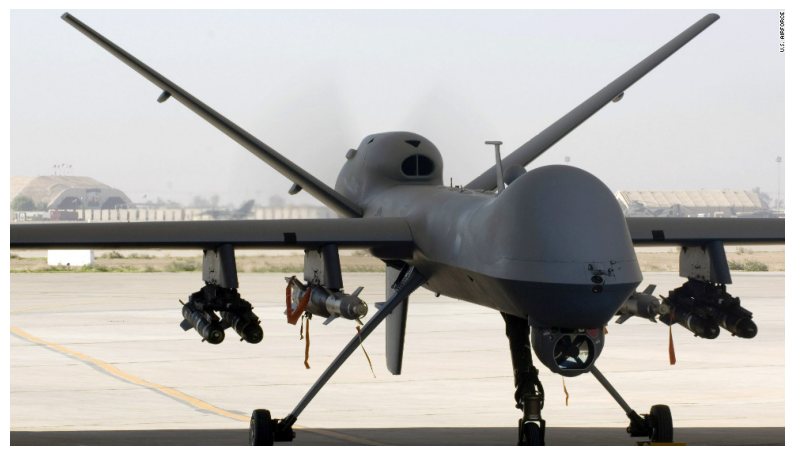

In [9]:
#@title Wybierz indeks przykładowego zdjęcia drona ze zbioru treningowego:

idx = 694 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(drone_fnames))
img_path = os.path.join(train_drone_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

(np.float64(-0.5), np.float64(659.5), np.float64(438.5), np.float64(-0.5))

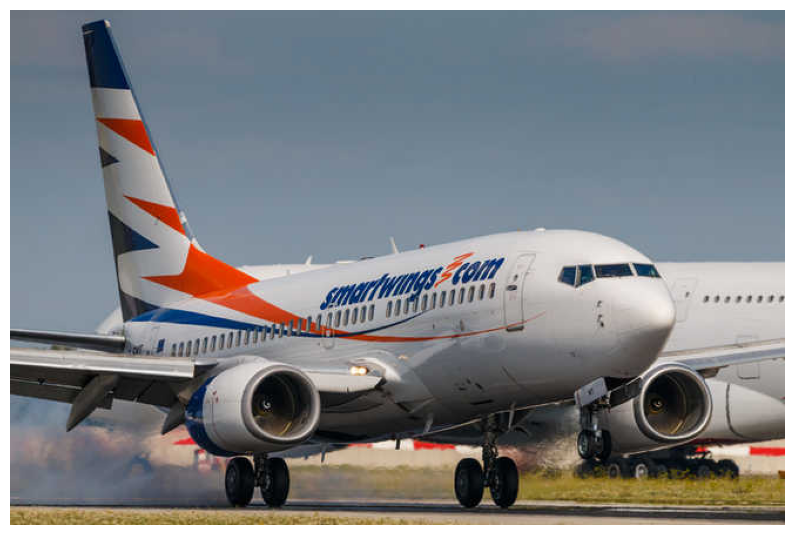

In [10]:
#@title Wybierz indeks przykładowego zdjęcia samolotu pasażerskiego ze zbioru treningowego:

idx = 699 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(passenger_fnames))
img_path = os.path.join(train_passenger_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

### <a name='a4'></a> Augmentcja danych

In [11]:
train_datagen = ImageDataGenerator(
    rotation_range=40,     # zakres kąta o który losowo zostanie wykonany obrót obrazów
    rescale=1./255.,
    width_shift_range=0.2,  # pionowe przekształcenia obrazu
    height_shift_range=0.2, # poziome przekształcenia obrazu
    shear_range=0.2,        # zares losowego przycianania obrazu
    zoom_range=0.2,         # zakres losowego przybliżania obrazu
    horizontal_flip=True,   # losowe odbicie połowy obrazu w płaszczyźnie poziomej
    fill_mode='nearest'     # strategia wypełniania nowo utworzonych pikseli, któe mogą powstać w wyniku przekształceń
)

# przeskalowujemy wszystkie obrazy o współczynnik 1/255
valid_datagen = ImageDataGenerator(rescale=1./255.)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

Found 1838 images belonging to 2 classes.
Found 524 images belonging to 2 classes.


In [12]:
def display_augmented_images(directory, idx):
    """
    Funkcja zwraca wykres przykładowych obrazów uzyskanych za pomocą techniki
    augmentacji danych.
    """
    fnames = [os.path.join(directory, fname) for fname in os.listdir(directory)]
    img_path = fnames[idx]
    img = image.load_img(img_path, target_size=(150, 150))

    x = image.img_to_array(img)
    x = x.reshape((1, ) + x.shape)

    i = 1
    plt.figure(figsize=(16, 8))
    for batch in train_datagen.flow(x, batch_size=1):
        plt.subplot(3, 4, i)
        plt.grid(False)
        imgplot = plt.imshow(image.array_to_img(batch[0]))
        i += 1
        if i % 13 == 0:
            break

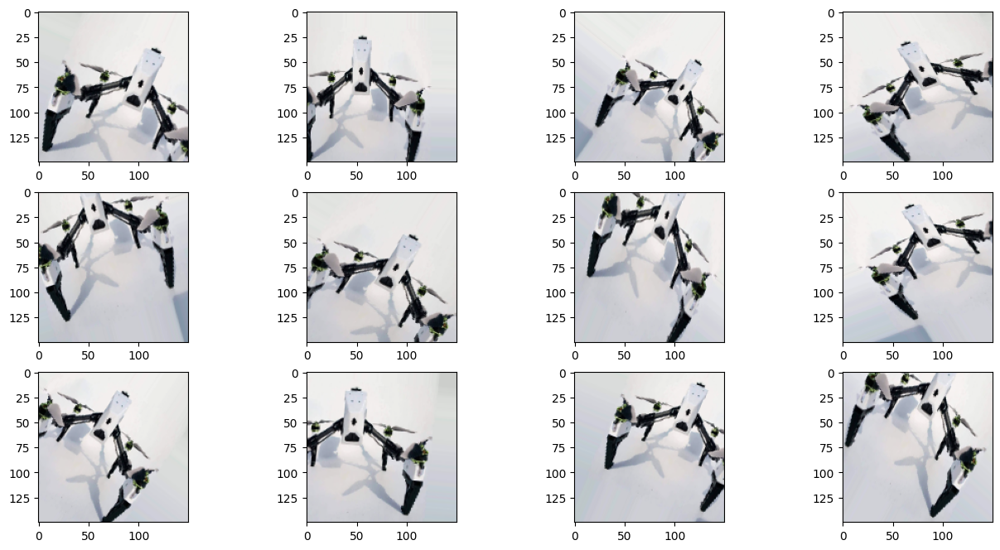

In [13]:
#@title Zbiór treningowy drone:
idx = 383 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_drone_dir, idx)

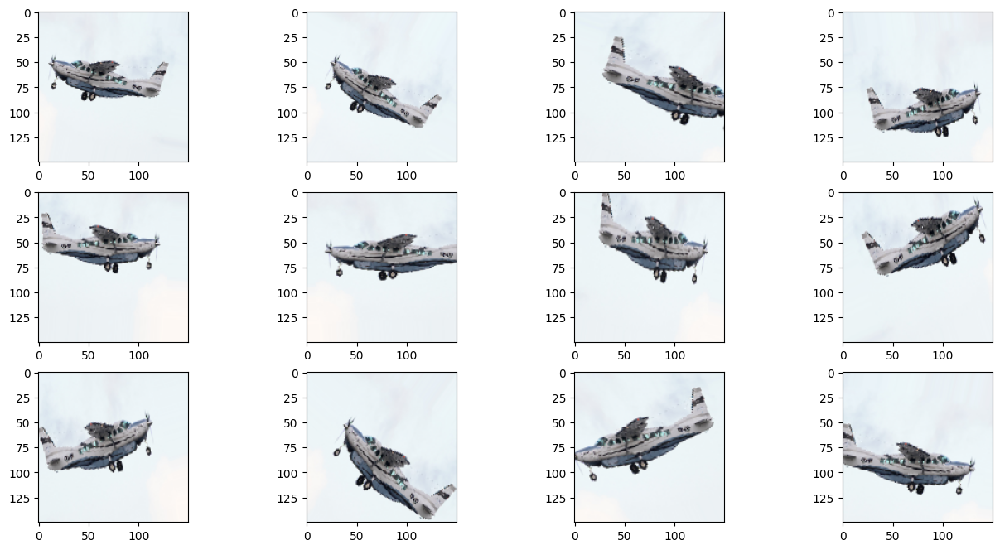

In [14]:
#@title Zbiór treningowy passenger:
idx = 111 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_passenger_dir, idx)

### <a name='a5'></a> Budowa modelu

In [15]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(units=512, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,453,121 (13.17 MB)

 Trainable params: 3,453,121 (13.17 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-04),
             loss='binary_crossentropy',
             metrics=['accuracy'])

In [17]:
!rm -rf logs
!mkdir logs

tensorboard = TensorBoard(log_dir='logs')

In [18]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=30,    # 100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 65s 2s/step - accuracy: 0.4765 - loss: 0.7071 - val_accuracy: 0.5430 - val_loss: 0.6900
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 61s 2s/step - accuracy: 0.4844 - loss: 0.6957 - val_accuracy: 0.5391 - val_loss: 0.6905
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.5469 - loss: 0.6911

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 304ms/step - accuracy: 0.5324 - loss: 0.6908 - val_accuracy: 0.4844 - val_loss: 0.6892
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.5352 - loss: 0.6899 - val_accuracy: 0.4922 - val_loss: 0.6908
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.5392 - loss: 0.6922 - val_accuracy: 0.4961 - val_loss: 0.6944
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 268ms/step - accuracy: 0.4224 - loss: 0.7025 - val_accuracy: 0.5430 - val_loss: 0.6842
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.5570 - loss: 0.6844 - val_accuracy: 0.5977 - val_loss: 0.6784
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.5659 - loss: 0.6814 - val_accuracy: 0.5898 - val_loss: 0.6831
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 308ms/step - accuracy: 0.5647 - loss: 0.6846 - val_accuracy: 0.6094 - val_loss: 0.6722
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.5576 - loss: 0.6808 - val_accuracy: 0.6172 - val_loss: 0

In [19]:
%load_ext tensorboard

In [20]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [21]:
def plot_hist(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['accuracy'], name='accuracy', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_accuracy'], name='val_accuracy', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Accuracy vs. Val Accuracy', xaxis_title='Epoki', yaxis_title='Accuracy', yaxis_type='log')
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['loss'], name='loss', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_loss'], name='val_loss', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Loss vs. Val Loss', xaxis_title='Epoki', yaxis_title='Loss', yaxis_type='log')
    fig.show()

plot_hist(history)

### <a name='a6'></a> Transfer learning - model VGG16

In [23]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
model = Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 16,812,353 (64.13 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
print(f'Liczba warstw trenowanych przed zamrożeniem {len(model.trainable_weights)}')
conv_base.trainable = False
print(f'Liczba warstw trenowanych po zamrożeniu {len(model.trainable_weights)}')

Liczba warstw trenowanych przed zamrożeniem 30
Liczba warstw trenowanych po zamrożeniu 4


In [26]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-4),
             loss='binary_crossentropy',
             metrics=['accuracy'])

In [27]:
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=50,    # 100
                    validation_data=valid_generator,
                    validation_steps=validation_steps,
                    callbacks=[tensorboard])

Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 323s 11s/step - accuracy: 0.6124 - loss: 0.7088 - val_accuracy: 0.7461 - val_loss: 0.5081
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 312s 11s/step - accuracy: 0.6830 - loss: 0.5669 - val_accuracy: 0.7227 - val_loss: 0.5246
Epoch 3/50
 2/28 ━━━━━━━━━━━━━━━━━━━━ 3:13 7s/step - accuracy: 0.7500 - loss: 0.5320

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 137s 5s/step - accuracy: 0.7790 - loss: 0.4838 - val_accuracy: 0.7266 - val_loss: 0.4761
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 339s 11s/step - accuracy: 0.7413 - loss: 0.5169 - val_accuracy: 0.7539 - val_loss: 0.4585
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 386s 14s/step - accuracy: 0.7676 - loss: 0.4767 - val_accuracy: 0.7734 - val_loss: 0.4726
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 137s 5s/step - accuracy: 0.7511 - loss: 0.4616 - val_accuracy: 0.7930 - val_loss: 0.4154
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 348s 13s/step - accuracy: 0.7485 - loss: 0.4846 - val_accuracy: 0.7539 - val_loss: 0.4736
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 359s 13s/step - accuracy: 0.7480 - loss: 0.4898 - val_accuracy: 0.7695 - val_loss: 0.4422
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 141s 5s/step - accuracy: 0.7651 - loss: 0.4817 - val_accuracy: 0.7773 - val_loss: 0.4211
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 323s 11s/step - accuracy: 0.7552 - loss: 0.4743 - val_accuracy: 0.7812 - val_lo

In [28]:
import plotly.graph_objects as go
plot_hist(history)

### <a name='a7'></a> Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw

In [29]:
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.trainable = True

def print_layers(model):
    for layer in model.layers:
        print(f'layer_name: {layer.name:13} trainable: {layer.trainable}')

print_layers(conv_base)

layer_name: input_layer_3 trainable: True
layer_name: block1_conv1  trainable: True
layer_name: block1_conv2  trainable: True
layer_name: block1_pool   trainable: True
layer_name: block2_conv1  trainable: True
layer_name: block2_conv2  trainable: True
layer_name: block2_pool   trainable: True
layer_name: block3_conv1  trainable: True
layer_name: block3_conv2  trainable: True
layer_name: block3_conv3  trainable: True
layer_name: block3_pool   trainable: True
layer_name: block4_conv1  trainable: True
layer_name: block4_conv2  trainable: True
layer_name: block4_conv3  trainable: True
layer_name: block4_pool   trainable: True
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [30]:
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

print_layers(conv_base)

layer_name: input_layer_3 trainable: False
layer_name: block1_conv1  trainable: False
layer_name: block1_conv2  trainable: False
layer_name: block1_pool   trainable: False
layer_name: block2_conv1  trainable: False
layer_name: block2_conv2  trainable: False
layer_name: block2_pool   trainable: False
layer_name: block3_conv1  trainable: False
layer_name: block3_conv2  trainable: False
layer_name: block3_conv3  trainable: False
layer_name: block3_pool   trainable: False
layer_name: block4_conv1  trainable: False
layer_name: block4_conv2  trainable: False
layer_name: block4_conv3  trainable: False
layer_name: block4_pool   trainable: False
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [31]:
model = Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-5),
             loss='binary_crossentropy',
             metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [32]:
history = model.fit(train_generator,
                             steps_per_epoch=steps_per_epoch,
                             epochs=30,    # 100
                             validation_data=valid_generator,
                             validation_steps=validation_steps,
                             callbacks=[tensorboard])

Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 355s 13s/step - accuracy: 0.6111 - loss: 0.6671 - val_accuracy: 0.7422 - val_loss: 0.5400
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 380s 14s/step - accuracy: 0.7257 - loss: 0.5541 - val_accuracy: 0.7227 - val_loss: 0.4986
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 4:22 10s/step - accuracy: 0.7500 - loss: 0.5238

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.7500 - loss: 0.5142 - val_accuracy: 0.7852 - val_loss: 0.4599
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 399s 13s/step - accuracy: 0.7553 - loss: 0.5095 - val_accuracy: 0.7891 - val_loss: 0.4283
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 381s 14s/step - accuracy: 0.7571 - loss: 0.4713 - val_accuracy: 0.7852 - val_loss: 0.3991
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 89s 3s/step - accuracy: 0.7478 - loss: 0.5024 - val_accuracy: 0.7930 - val_loss: 0.4086
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 352s 13s/step - accuracy: 0.7935 - loss: 0.4437 - val_accuracy: 0.8047 - val_loss: 0.3816
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 345s 12s/step - accuracy: 0.8133 - loss: 0.4026 - val_accuracy: 0.8047 - val_loss: 0.4008
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 88s 3s/step - accuracy: 0.7997 - loss: 0.4768 - val_accuracy: 0.8008 - val_loss: 0.4242
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 383s 13s/step - accuracy: 0.8077 - loss: 0.4250 - val_accuracy: 0.8398 - val_loss

In [33]:
plot_hist(history)

### <a name='a8'></a> Ocena modelu na zbiorze testowym

In [34]:
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

y_prob = model.predict(test_generator, test_generator.samples)
y_prob = y_prob.ravel()
y_prob

Found 262 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



262/262 ━━━━━━━━━━━━━━━━━━━━ 71s 271ms/step


array([0.000123, 0.003641, 0.049286, 0.18731 , 0.011766, 0.012039,
       0.002802, 0.049378, 0.278502, 0.002844, 0.054183, 0.001276,
       0.155565, 0.002015, 0.012499, 0.003995, 0.000419, 0.013711,
       0.012612, 0.545529, 0.002994, 0.02166 , 0.554589, 0.000094,
       0.005215, 0.854852, 0.126634, 0.000169, 0.33743 , 0.032222,
       0.851698, 0.018625, 0.515094, 0.007142, 0.028208, 0.040658,
       0.025074, 0.002907, 0.000254, 0.180931, 0.030159, 0.201406,
       0.037965, 0.315163, 0.000651, 0.004362, 0.048842, 0.01598 ,
       0.114212, 0.058775, 0.174015, 0.001771, 0.000762, 0.153963,
       0.210322, 0.009405, 0.440616, 0.001575, 0.00266 , 0.649121,
       0.012686, 0.014749, 0.093312, 0.345101, 0.002072, 0.014831,
       0.008854, 0.024656, 0.002217, 0.024832, 0.003416, 0.03088 ,
       0.0322  , 0.051918, 0.019692, 0.474376, 0.012817, 0.132791,
       0.943177, 0.059498, 0.039553, 0.065911, 0.107099, 0.049769,
       0.431039, 0.011895, 0.008575, 0.010189, 0.219021, 0.134

In [35]:
predictions  = pd.DataFrame({'y_prob': y_prob})
predictions['class'] = predictions['y_prob'].apply(lambda x: 1 if x > 0.5 else 0)
predictions

,y_prob,class
0,0.000123,0
1,0.003641,0
2,0.049286,0
3,0.187310,0
4,0.011766,0
...,...,...
257,0.290974,0
258,0.356824,0
259,0.810031,1
260,0.540826,1


In [36]:
y_pred = predictions['class'].values
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1])

In [37]:
test_generator.class_indices

{'drone': 0, 'passenger': 1}

In [38]:
cm = confusion_matrix(test_generator.classes, y_pred)
cm

array([[116,  15],
       [ 30, 101]])

In [41]:
print(classification_report(test_generator.classes, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.89      0.84       131
           1       0.87      0.77      0.82       131

    accuracy                           0.83       262
   macro avg       0.83      0.83      0.83       262
weighted avg       0.83      0.83      0.83       262



### <a name='a9'></a> Wyświetlenie błędów predykcji

In [43]:
y_true = test_generator.classes
errors = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred}, index=test_generator.filenames)
errors.head()

,y_true,y_pred
drone/00000005.jpg,0,0
drone/00000008.jpg,0,0
drone/00000011.jpeg,0,0
drone/00000031.jpg,0,0
drone/00000044.jpg,0,0


In [44]:
errors['is_incorrect'] = (errors['y_true'] != errors['y_pred']) * 1
errors

,y_true,y_pred,is_incorrect
drone/00000005.jpg,0,0,0
drone/00000008.jpg,0,0,0
drone/00000011.jpeg,0,0,0
drone/00000031.jpg,0,0,0
drone/00000044.jpg,0,0,0
...,...,...,...
passenger/00001453.jpg,1,0,1
passenger/00001471.jpg,1,0,1
passenger/00001473.jpg,1,1,0
passenger/00001474.jpg,1,1,0


In [45]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000193.jpeg', 'drone/00000206.jpg', 'drone/00000236.jpg',
       'drone/00000296.png', 'drone/00000306.jpg', 'drone/00000609.jpg',
       'drone/00000779.jpg', 'drone/00000940.jpg', 'drone/00000941.jpg',
       'drone/00001163.jpg', 'drone/00001318.jpg', 'drone/00001325.jpg',
       'drone/00001352.jpg', 'drone/00001384.jpg', 'drone/00001426.jpg',
       'passenger/00000085.jpg', 'passenger/00000247.jpg',
       'passenger/00000362.jpg', 'passenger/00000402.jpg',
       'passenger/00000419.png', 'passenger/00000436.jpg',
       'passenger/00000439.jpg', 'passenger/00000461.jpg',
       'passenger/00000493.jpg', 'passenger/00000498.jpg',
       'passenger/00000524.jpg', 'passenger/00000582.jpg',
       'passenger/00000590.jpg', 'passenger/00000614.jpeg',
       'passenger/00000629.jpg', 'passenger/00000633.png',
       'passenger/00000670.jpg', 'passenger/00000708.jpg',
       'passenger/00000752.jpg', 'passenger/00000983.jpg',
       'passenger/00000989.jpg', 'passenger

(np.float64(-0.5), np.float64(645.5), np.float64(361.5), np.float64(-0.5))

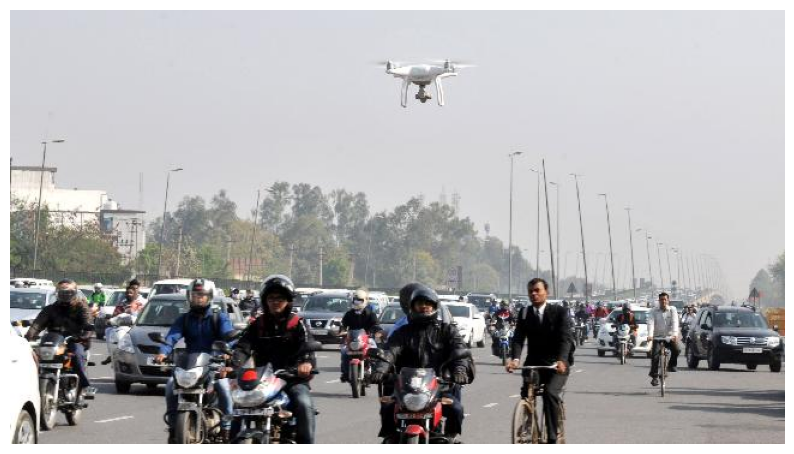

In [47]:
img_path = os.path.join(test_drone_dir, '00000193.jpeg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

In [48]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000193.jpeg', 'drone/00000206.jpg', 'drone/00000236.jpg',
       'drone/00000296.png', 'drone/00000306.jpg', 'drone/00000609.jpg',
       'drone/00000779.jpg', 'drone/00000940.jpg', 'drone/00000941.jpg',
       'drone/00001163.jpg', 'drone/00001318.jpg', 'drone/00001325.jpg',
       'drone/00001352.jpg', 'drone/00001384.jpg', 'drone/00001426.jpg',
       'passenger/00000085.jpg', 'passenger/00000247.jpg',
       'passenger/00000362.jpg', 'passenger/00000402.jpg',
       'passenger/00000419.png', 'passenger/00000436.jpg',
       'passenger/00000439.jpg', 'passenger/00000461.jpg',
       'passenger/00000493.jpg', 'passenger/00000498.jpg',
       'passenger/00000524.jpg', 'passenger/00000582.jpg',
       'passenger/00000590.jpg', 'passenger/00000614.jpeg',
       'passenger/00000629.jpg', 'passenger/00000633.png',
       'passenger/00000670.jpg', 'passenger/00000708.jpg',
       'passenger/00000752.jpg', 'passenger/00000983.jpg',
       'passenger/00000989.jpg', 'passenger

(np.float64(-0.5), np.float64(499.5), np.float64(333.5), np.float64(-0.5))

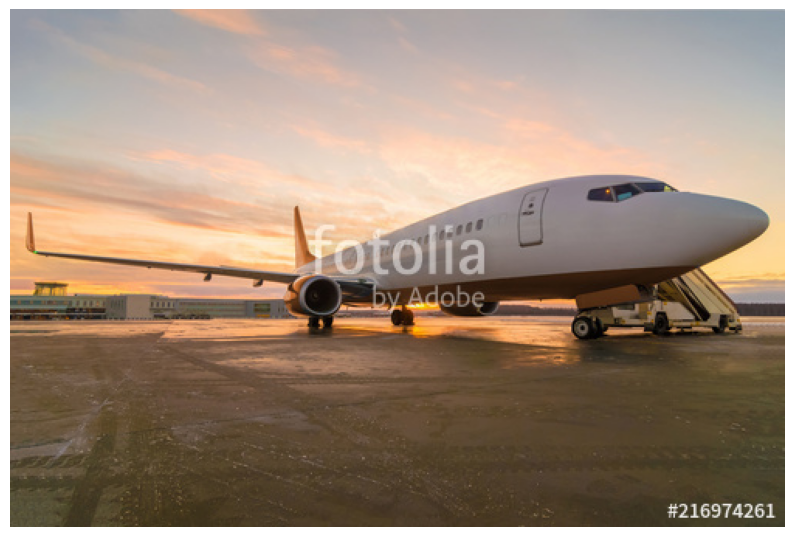

In [50]:
img_path = os.path.join(test_passenger_dir, '00001352.jpg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)